# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding** 
***

### The Goal of this Project

In this project, your goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. The camera calibration images, test road images, and project videos are available in the [project repository](https://github.com/udacity/CarND-Advanced-Lane-Lines).

### Steps

* CAMERA CALIBRATION
* DISTORTION CORRECTION
* COLOR & GRADIENT THRESHOLD
* PERSPECTIVE TRANSFORM
* LANE LINE DETECTION
* LINE SHAPE AND POSITION
* VISUALIZATION

### Import Packages

In [1]:
#importing some useful packages

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob
import os
import math
from scipy.signal import find_peaks_cwt
%matplotlib inline

### Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  

`cv2.fillPoly()` for regions selection  

`cv2.line()` to draw lines on an image given endpoints  

`cv2.addWeighted()` to coadd / overlay two images

`cv2.cvtColor()` to grayscale or change color

`cv2.imwrite()` to output images to file  

`cv2.bitwise_and()` to apply a mask to an image

`cv2.COLOR_RGB2GRAY`

`cv2.Sobel`

`cv2.undistort`

`cv2.findChessboardCorners`

`cv2.drawChessboardCorners`

`cv2.getPerspectiveTransform`

`cv2.warpPerspective`

`cv2.COLOR_RGB2HLS`


**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Camera Calibration

In [2]:
# prepare object points
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        #cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        #write_name_corner = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name_corner, img)
        
        #cv2.imshow('img', img)
        #cv2.waitKey(700)

#cv2.destroyAllWindows()

### Visualize the calibrated images (chessboard images)

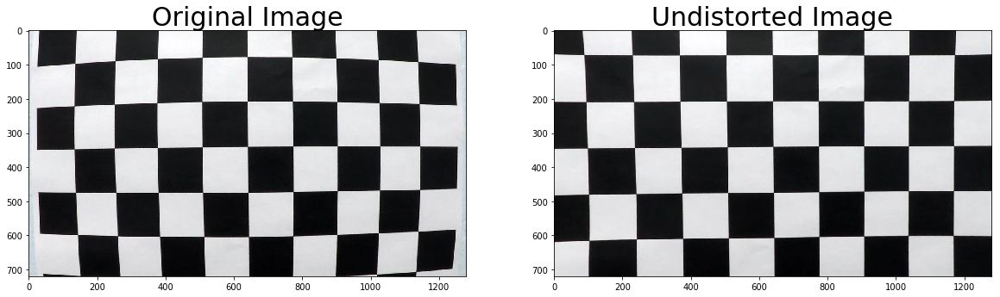

In [3]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
# cv2.imwrite('calibrated1.jpg',dst)

# Save the camera calibration result for later use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

#### Read in images, Distortion correction

In [4]:
os.listdir("test_images/")

['test5.jpg',
 'test1.jpg',
 'straight_lines2.jpg',
 'test6.jpg',
 'test3.jpg',
 'straight_lines1.jpg',
 'test2.jpg',
 'test4.jpg']

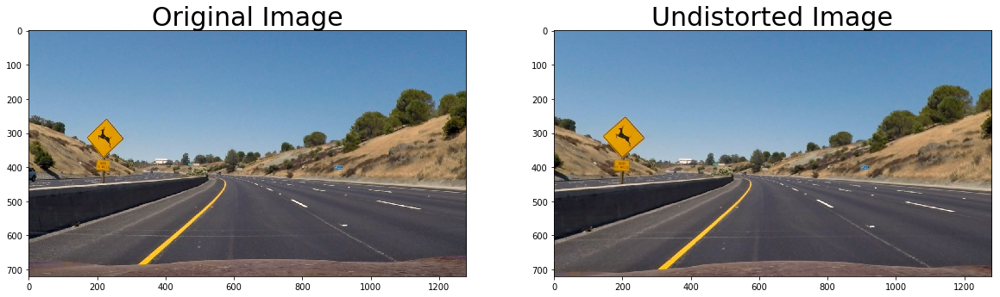

In [5]:
#reading in an image
# test images
test_image = mpimg.imread('test_images/test2.jpg')

'''
straight_lines1
straight_lines2
test1
test2
test3
test4
test5
test6
'''

undst_test_img = cv2.undistort(test_image, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undst_test_img)
ax2.set_title('Undistorted Image', fontsize=30)

### Define Functions

In [6]:
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

In [7]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [8]:
# Calculate directional gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    if orient == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
        abs_sobelx = np.absolute(sobelx)
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    elif orient == 'y':
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        abs_sobely = np.absolute(sobely)
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
    else:
        print('the second argument should be either x or y')
    
    binary_grad = np.zeros_like(scaled_sobel)
    binary_grad[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_grad

In [9]:
# Calculate gradient magnitude
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)

    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    gradmag = np.sqrt(sobelx**2 + sobely**2)

    scaled_sobel = np.uint8(255*gradmag/np.max(gradmag))

    
    binary_mag = np.zeros_like(scaled_sobel)
    binary_mag[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_mag

In [10]:
# Calculate gradient direction
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx)

    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobely = np.absolute(sobely)

    dir_grad = np.arctan2(abs_sobely, abs_sobelx)

    binary_dir = np.zeros_like(dir_grad)
    binary_dir[(dir_grad >= thresh[0]) & (dir_grad <= thresh[1])] = 1
    return binary_dir

In [11]:
def hls_select(img, thresh_S=(90, 255)):
    #, thresh_H = (15, 100)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # H = hls[:,:,0]
    # L = hls[:,:,1]
    S = hls[:,:,2]

    binary_S = np.zeros_like(S)
    binary_S[(S > thresh_S[0]) & (S <= thresh_S[1])] = 1
    
    
    #binary_H = np.zeros_like(H)
    #binary_H[(H > thresh_H[0]) & (H <= thresh_H[1])] = 1
    
    #binary = np.zeros_like(S)
    #binary[(binary_S == 1) | (binary_H == 1)] = 1
    
    return binary_S

### Add the following function in color thresholding

An idea for more robust extraction is to try color thresholding in all the RGB, HSV and HSL channels for your yellows and whites! By using color thresholding you are able to make the lane detection more robust by relying less on gradients for good results! Furthermore, thresholding is a lot faster in terms of processing than gradients!

In [12]:
def yellow_white_select(img):
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # For yellow
    yellow = cv2.inRange(HSV, (20, 100, 100), (50, 255, 255))

    # For white
    sensitivity_1 = 68
    white = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

    sensitivity_2 = 60
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))
    
    white_3 = cv2.inRange(img, (200,200,200), (255,255,255))

    return yellow, white, white_2, white_3

In [13]:
def gray_select(img, thresh=(180, 255)):

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary

### Color & Gradient threshold

In [44]:
def pipeline(img):
    # img = cv2.undistort(img, mtx, dist, None, mtx)
    # Choose a blue kernel
    blur_kernel_size = 5
    img = gaussian_blur(img, blur_kernel_size)
    
    # Choose a Sobel kernel size
    ksize = 5 # Choose a larger odd number to smooth gradient measurements
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.6, 1.3))
    hls_binary = hls_select(img, thresh_S=(90, 255)) # ,  thresh_H = (15, 100)
    
    yellow, white, white_2, white_3 = yellow_white_select(img)
    
    combined = np.zeros_like(dir_binary)
    # combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1

    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1) | (yellow == 1) | (white == 1) | (white_2 == 1) | (white_3 == 1)] = 1
    
    
    # add a mask
    imshape = combined.shape
    # vertices = np.array([[(0,imshape[0]),(imshape[1]/2,imshape[0]/2+40), (imshape[1],imshape[0])]], dtype=np.int32)
    
    # change area of interest
    # vertices = np.array([[(0,imshape[0]),(400,imshape[0]/3*2), (imshape[1]-400,imshape[0]/3*2), (imshape[1],imshape[0])]], dtype=np.int32)
    
    vertices = np.array([[(0,imshape[0]),(imshape[1]/2-140,imshape[0]/2+80), (imshape[1]/2+140,imshape[0]/2+80), (imshape[1],imshape[0])]], dtype=np.int32)
    
    masked_edges = region_of_interest(combined, vertices)
    
    return masked_edges

### Test images of straight lines

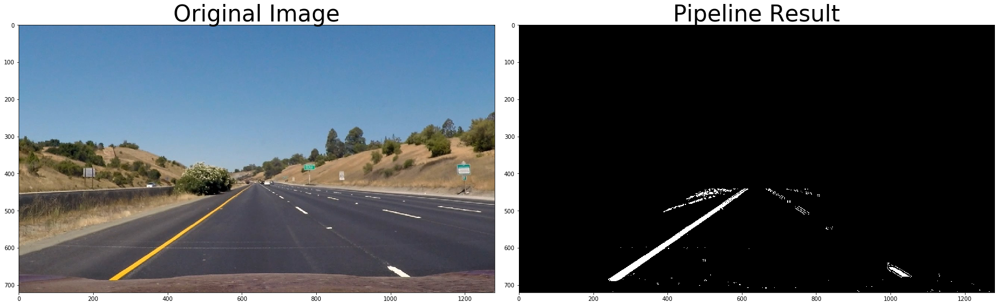

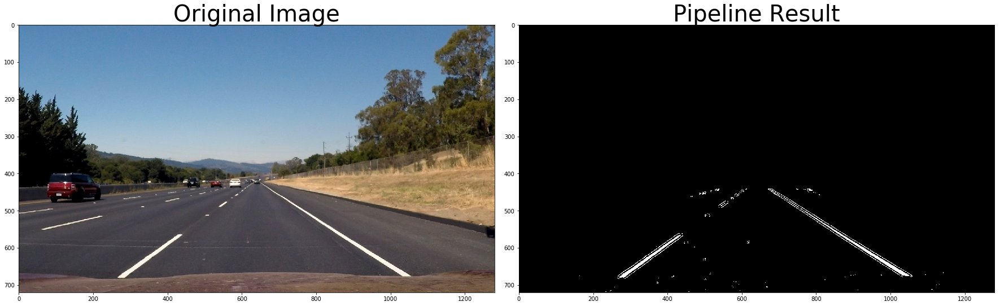

In [15]:
for i in range(1,3):
    fname = 'test_images/straight_lines{}.jpg'.format(i)
    image = mpimg.imread(fname)
    result = pipeline(image)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Test images of curve lines

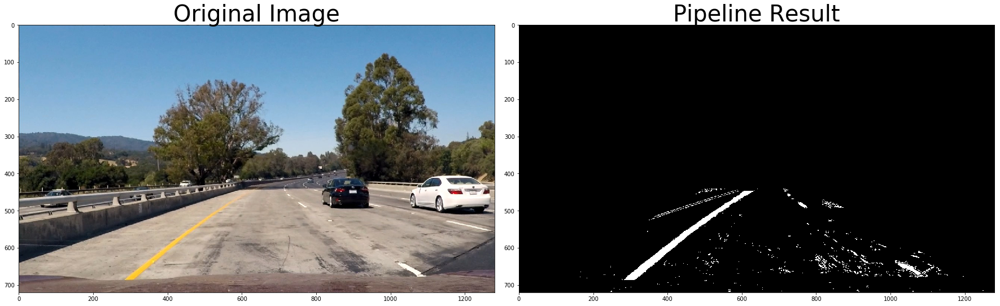

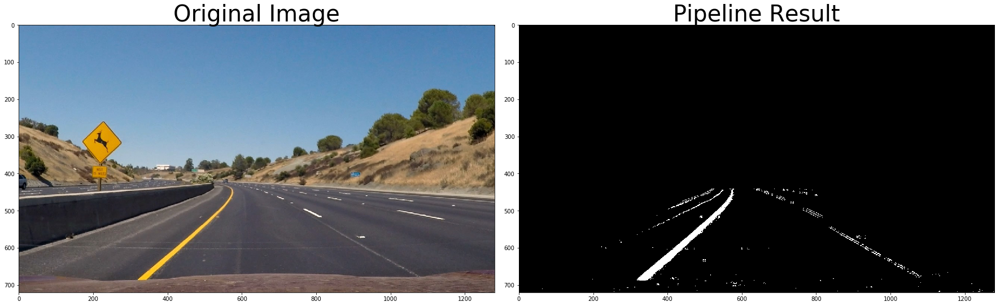

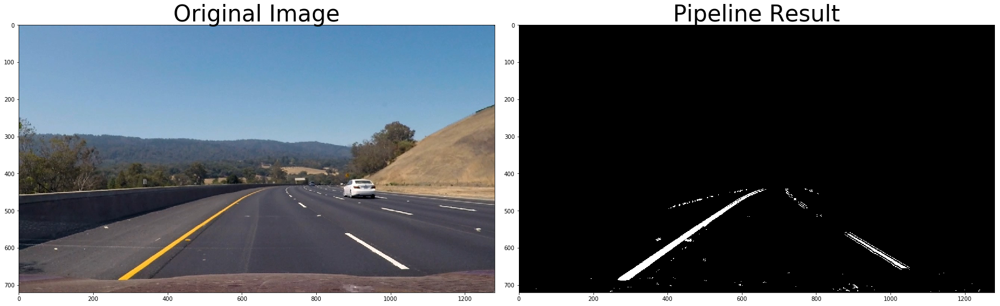

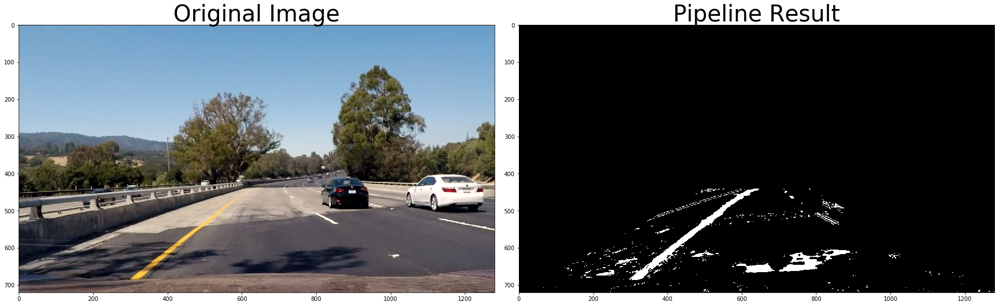

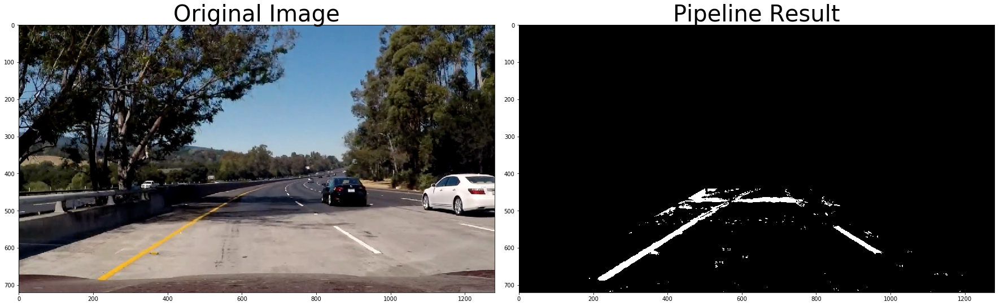

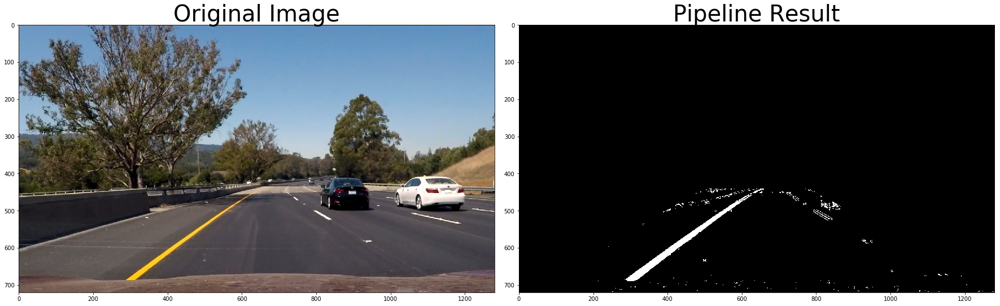

In [16]:
for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = mpimg.imread(fname)
    result = pipeline(image)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective Transform

You would like to pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above. 
The easiest way to do this is to investigate an image where the lane lines are straight, and find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

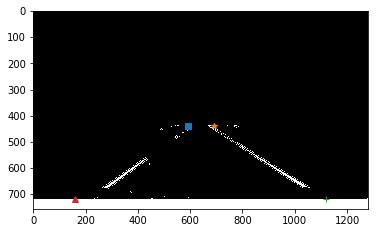

In [17]:
# area_of_interest = [[170,720],[540,480],[750,480],[1140,720]]

area_of_interest = [[160,720],[590,440],[690,440],[1120,720]]

fname = 'test_images/straight_lines2.jpg'
image = mpimg.imread(fname)
result = pipeline(image)
    
plt.imshow(result, cmap='gray')
plt.plot(590,440,'s')
plt.plot(690,440,'*')
plt.plot(1120,720,'+')
plt.plot(160,720,'^')

In [18]:
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Choose an offset from image corners to plot detected corners
    offset1 = 200 # offset for dst points x value
    offset2 = 0 # offset for dst points bottom y value
    offset3 = 0 # offset for dst points top y value
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    # For source points I'm grabbing the outer four detected corners
    src = np.float32(area_of_interest)
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    dst = np.float32([[offset1, img_size[1]-offset2], [offset1, offset3], 
                      [img_size[0]-offset1, offset3], 
                      [img_size[0]-offset1, img_size[1]-offset2]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    # Return the resulting image and matrix
    return warped, M, Minv

### Test Perspective Transform

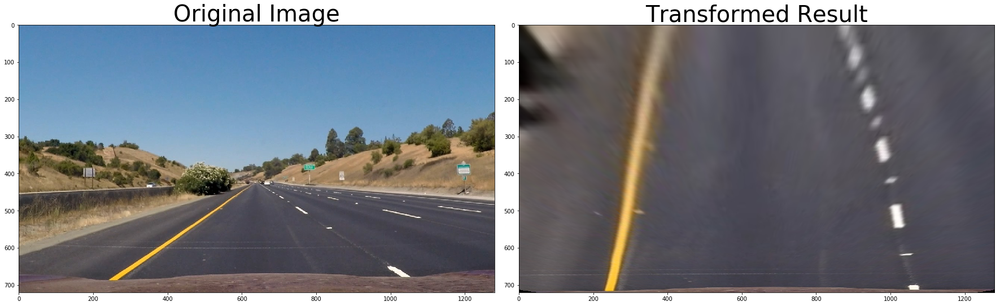

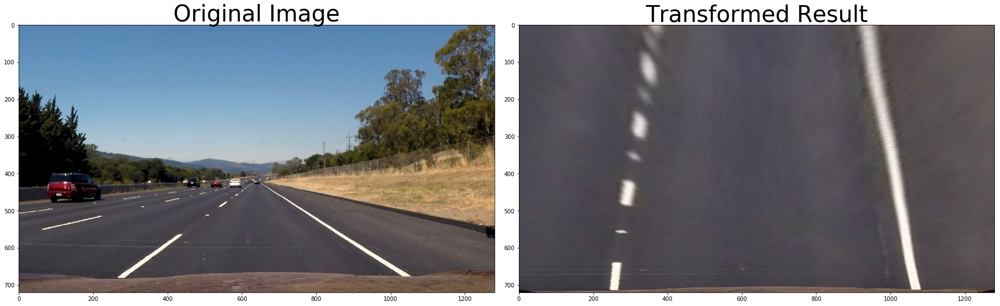

In [19]:
# straight line
for i in range(1,3):
    fname = 'test_images/straight_lines{}.jpg'.format(i)
    image = mpimg.imread(fname)
    
    warped, _, _, = corners_unwarp(image, nx, ny, mtx, dist)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(warped)
    ax2.set_title('Transformed Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

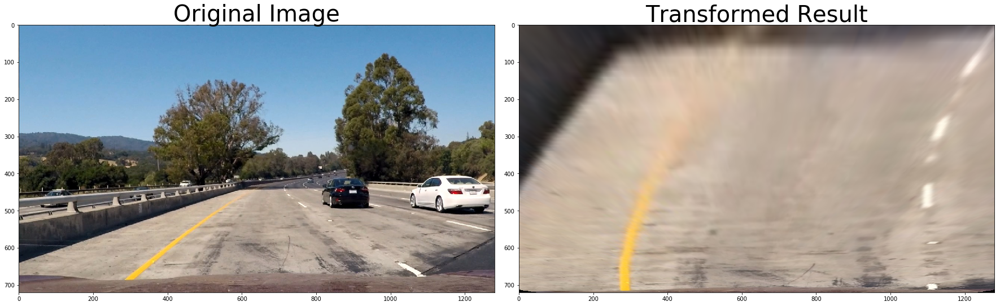

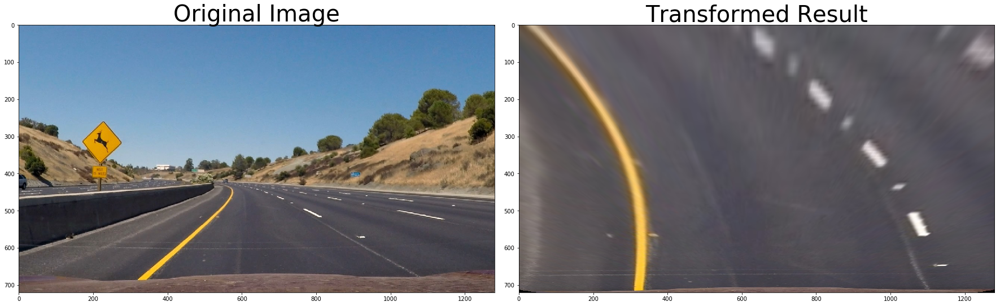

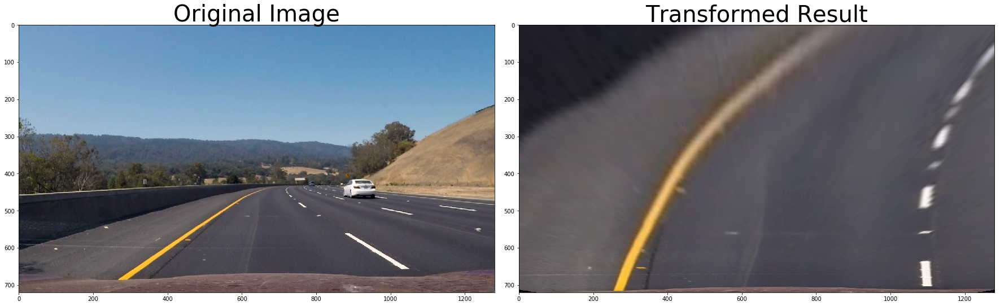

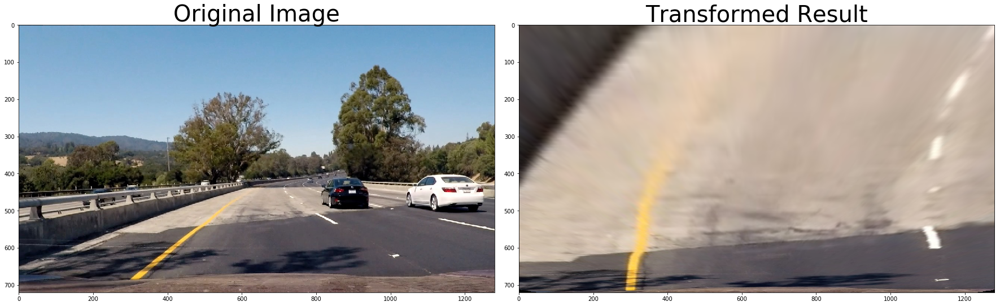

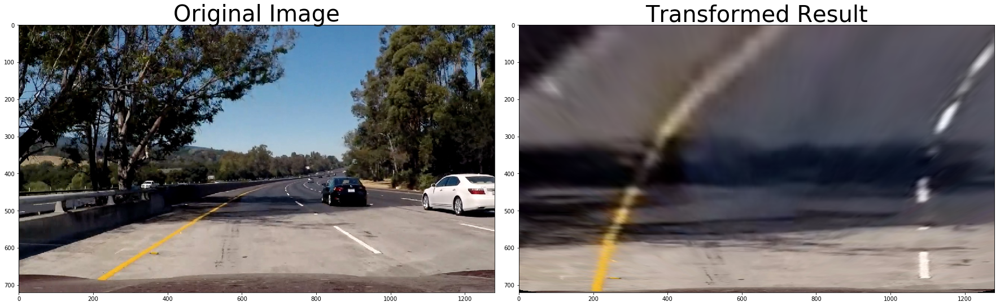

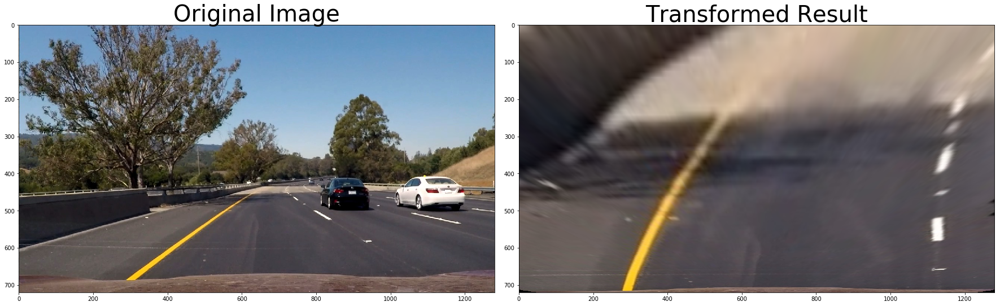

In [20]:
# curve lines
for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = mpimg.imread(fname)
    warped, _, _, = corners_unwarp(image, nx, ny, mtx, dist)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(warped)
    ax2.set_title('Transformed Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [21]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        
        #x values for detected line pixels
        self.allx = None  
        
        #x values in windows
        self.windows = np.ones((3,12))*-1

### Calculated the radius of curvature of the lane and the position of the vehicle with respect to center

#### Revise the measurement of curvature

Here are some things to try:

* Try fitting the middle of the polynomial with this change: ```y_eval = np.max(ploty)/2```
* Be sure to convert `y_eval` to meters in your `curverad`
* Be on the look out for radius of curvatures between 400-1500 meters for you curves and values higher than 2500 m for when the road appears to be straight.

In [22]:
def find_curvature(yvals, fitx, image):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/image.shape[0] # 720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    fit_cr = np.polyfit(yvals*ym_per_pix, fitx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # Choose the maximum y-value, corresponding to the bottom of the image
    # middle
    y_eval1 = np.max(yvals)/2-60
    y_eval2 = np.max(yvals)/2
    y_eval3 = np.max(yvals)/2+60
    
    curverad1 = ((1 + (2*fit_cr[0]*y_eval1 + fit_cr[1])**2)**1.5)/np.absolute(2*fit_cr[0])
    curverad2 = ((1 + (2*fit_cr[0]*y_eval2 + fit_cr[1])**2)**1.5)/np.absolute(2*fit_cr[0])
    curverad3 = ((1 + (2*fit_cr[0]*y_eval3 + fit_cr[1])**2)**1.5)/np.absolute(2*fit_cr[0])
    
    #print(curverad1, curverad2)
    
    curverad = np.mean([curverad1, curverad2, curverad3])
    
    return curverad

def find_position(pts, image):
    # Find the position of the car from the center
    # It will show if the car is 'x' meters from the left or right
    position = image.shape[1]/2
    
    left  = np.min(pts[(pts[:,1] < position) & (pts[:,0] > image.shape[0]-55)][:,1])
    right = np.max(pts[(pts[:,1] > position) & (pts[:,0] > image.shape[0]-55)][:,1])
    center = (left + right)/2
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension    
    return (position - center)*xm_per_pix

In [23]:
def find_peaks(image, y_window_top, y_window_bottom, x_left, x_right):
    # Find the historgram from the image inside the window
    histogram = np.sum(image[y_window_top:y_window_bottom,:], axis=0)
    # Find the max from the histogram
    if len(histogram[int(x_left):int(x_right)])>0:
        return np.argmax(histogram[int(x_left):int(x_right)]) + x_left
    else:
        return (x_left + x_right) / 2  

In [24]:
def sanity_check(lane, curverad, fitx, fit):       
    # Sanity check for the lane
    if lane.detected: # If lane is detected
        # If sanity check passes
        if abs(curverad / lane.radius_of_curvature - 1) < .6:        
            lane.detected = True
            lane.current_fit = fit
            lane.allx = fitx
            lane.bestx = np.mean(fitx)            
            lane.radius_of_curvature = curverad
            
        # If sanity check fails use the previous values
        else:
            lane.detected = False
            fitx = lane.allx
    else:
        # If lane was not detected and no curvature is defined
        if lane.radius_of_curvature: 
            if abs(curverad / lane.radius_of_curvature - 1) < 1:            
                lane.detected = True
                lane.current_fit = fit
                lane.allx = fitx
                lane.bestx = np.mean(fitx)            
                lane.radius_of_curvature = curverad
                
            else:
                lane.detected = False
                fitx = lane.allx      
        # If curvature was defined
        else:
            lane.detected = True
            lane.current_fit = fit
            lane.allx = fitx
            lane.bestx = np.mean(fitx)
            lane.radius_of_curvature = curverad
    return fitx

In [25]:
# Sanity check for the direction
def sanity_check_direction(right, right_pre, right_pre2):
    # If the direction is ok then pass
    if abs((right-right_pre) / (right_pre-right_pre2) - 1) < .33:
        return right
    # If not then compute the value from the previous values
    else:
        return right_pre + (right_pre - right_pre2) # or (right_pre + right_pre2)/2

In [26]:
# find_lanes function will detect left and right lanes from the warped image.  
def find_lanes(n, image, x_window, lanes, left_lane_x, left_lane_y, right_lane_x, right_lane_y, window_ind):
    # 'n' windows will be used to identify peaks of histograms
    # Set index1. This is used for placeholder.
    index1 = np.zeros((n+1,2))
    index1[0] = [image.shape[1]/4-35, image.shape[1] - 200]# [300, 1100]
    index1[1] = [image.shape[1]/4-35, image.shape[1] - 200]# [300, 1100]
    # Set the first left and right values
    left, right = [image.shape[1]/4-35, image.shape[1] - 200]# (300, 1100)
    # Set the center
    center = image.shape[1]/2+50 # 700
    # Set the previous center
    center_pre = center
    # Set the direction
    direction = 0
    
    for i in range(n-1):
        # set the window range.
        y_window_top = np.int(image.shape[0] - image.shape[0]/n*(i+1))
        y_window_bottom = np.int(image.shape[0] - image.shape[0]/n*i)
        # If left and right lanes are detected from the previous image
        if (left_lane.detected==False) and (right_lane.detected==False):
            # Find the historgram from the image inside the window
            left  = find_peaks(image, y_window_top, y_window_bottom, index1[i+1,0]-200, index1[i+1,0]+200)
            right = find_peaks(image, y_window_top, y_window_bottom, index1[i+1,1]-200, index1[i+1,1]+200)
            # Set the direction
            left  = sanity_check_direction(left, index1[i+1,0], index1[i,0])
            right = sanity_check_direction(right, index1[i+1,1], index1[i,1]) 
            # Set the center
            center_pre = center
            center = (left + right)/2
            direction = center - center_pre
        # If both lanes were detected in the previous image
        # Set them equal to the previous one
        else:
            left  = left_lane.windows[window_ind, i]
            right = right_lane.windows[window_ind, i]
            
        # Make sure the distance between left and right laens are wide enough
        if abs(left-right) > (image.shape[1]/2-50): # 600
            # Append coordinates to the left lane arrays
            left_lane_array = lanes[(lanes[:,1]>=left-x_window) & (lanes[:,1]<left+x_window) &
                                 (lanes[:,0]<=y_window_bottom) & (lanes[:,0]>=y_window_top)]
            left_lane_x += left_lane_array[:,1].flatten().tolist()
            left_lane_y += left_lane_array[:,0].flatten().tolist()
            if not math.isnan(np.mean(left_lane_array[:,1])):
                left_lane.windows[window_ind, i] = np.mean(left_lane_array[:,1])
                index1[i+2,0] = np.mean(left_lane_array[:,1])
            else:
                index1[i+2,0] = index1[i+1,0] + direction
                left_lane.windows[window_ind, i] = index1[i+2,0]
                
            # Append coordinates to the right lane arrays            
            right_lane_array = lanes[(lanes[:,1]>=right-x_window) & (lanes[:,1]<right+x_window) &
                                  (lanes[:,0]<y_window_bottom) & (lanes[:,0]>=y_window_top)]
            right_lane_x += right_lane_array[:,1].flatten().tolist()
            right_lane_y += right_lane_array[:,0].flatten().tolist()
            if not math.isnan(np.mean(right_lane_array[:,1])):
                right_lane.windows[window_ind, i] = np.mean(right_lane_array[:,1])
                index1[i+2,1] = np.mean(right_lane_array[:,1])
            else:
                index1[i+2,1] = index1[i+1,1] + direction
                right_lane.windows[window_ind, i] = index1[i+2,1]
    return left_lane_x, left_lane_y, right_lane_x, right_lane_y

In [27]:
# Function to find the fitting lines from the warped image
def fit_lanes(image):
    # define y coordinate values for plotting
    yvals = np.linspace(0, 100, num=101)*image.shape[0]/100 # 7.2  # to cover same y-range as image
    # find the coordinates from the image
    lanes = np.argwhere(image)
    # Coordinates for left lane
    left_lane_x = []
    left_lane_y = []
    # Coordinates for right lane
    right_lane_x = []
    right_lane_y = []
    # Curving left or right - -1: left 1: right
    curve = 0
    # Set left and right as None
    left = None
    right = None
    # Find lanes from three repeated procedures with different window values
    left_lane_x, left_lane_y, right_lane_x, right_lane_y \
        = find_lanes(4, image, 25, lanes, left_lane_x, left_lane_y, right_lane_x, right_lane_y, 0)
    left_lane_x, left_lane_y, right_lane_x, right_lane_y \
        = find_lanes(6, image, 50, lanes, left_lane_x, left_lane_y, right_lane_x, right_lane_y, 1)
    left_lane_x, left_lane_y, right_lane_x, right_lane_y \
        = find_lanes(8, image, 75, lanes, left_lane_x, left_lane_y, right_lane_x, right_lane_y, 2)
    # Find the coefficients of polynomials
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
    # Find curvatures
    left_curverad  = find_curvature(yvals, left_fitx, image)
    right_curverad = find_curvature(yvals, right_fitx, image)
    
    #curverad = np.mean([left_curverad, right_curverad])
    curverad = min(left_curverad, right_curverad)
    
    # Sanity check for the lanes
    left_fitx  = sanity_check(left_lane, left_curverad, left_fitx, left_fit)
    right_fitx = sanity_check(right_lane, right_curverad, right_fitx, right_fit)
    
    return yvals, left_fitx, right_fitx, left_lane_x, left_lane_y, right_lane_x, right_lane_y, curverad

In [28]:
# draw poly on an image
# def draw_poly(image, warped, yvals, left_fitx, right_fitx, Minv):
def draw_poly(image, warped, yvals, left_fitx, right_fitx, left_lane_x, left_lane_y, right_lane_x, right_lane_y, Minv, curvature):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(50,100), font, 1,(255,255,255),2)
    
    #print(text)
    
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
        
    position = find_position(pts, image)
    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(50,150), font, 1,(255,255,255),2)
    
    #print(text)
    
    return result

In [29]:
# This function will color the image
# Input: Original image
# Output: Original image with colored region
def process_image(image):
    # Apply pipeline to the image to create black and white image
    img = pipeline(image)
    
    # Warp the image to make lanes parallel to each other
    top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)
    
    
    
    # Find the lines fitting to left and right lanes
    a, b, c, lx, ly, rx, ry, curvature = fit_lanes(top_down)
    # yvals, left_fitx, right_fitx, left_lane_x, left_lane_y, right_lane_x, right_lane_y, left_curverad
    
    # Return the original image with colored region
    return draw_poly(image, top_down, a, b, c, lx, ly, rx, ry, perspective_Minv, curvature)

/home/yinghui/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


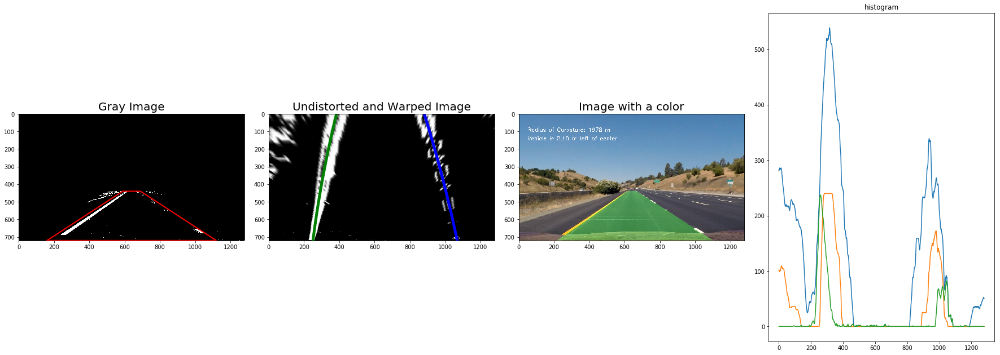

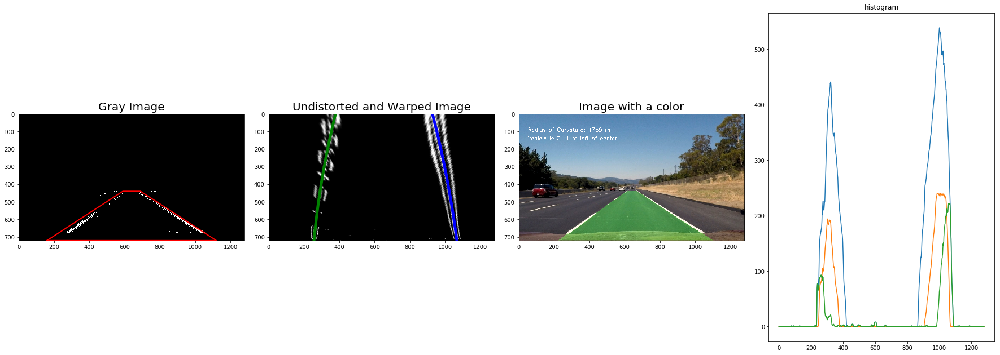

In [30]:
# These are to be used to plot lines on images
x_values = [area_of_interest[0][0],area_of_interest[1][0],area_of_interest[2][0],area_of_interest[3][0],area_of_interest[0][0]]
y_values = [area_of_interest[0][1],area_of_interest[1][1],area_of_interest[2][1],area_of_interest[3][1],area_of_interest[0][1]]

# Plot 6 example images and warp them
for i in range(1,3):
    # Set up lines for left and right
    left_lane = Line()
    right_lane = Line()
    
    # load the image
    fname = 'test_images/straight_lines{}.jpg'.format(i)
    img_raw = mpimg.imread(fname)
    # Apply pipeline to the image to create black and white image
    img = pipeline(img_raw)
    # Unwrap the image
    top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)
    # Set up for the subplots
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    
    # Showing the image from pipeline with marked areas
    ax1.set_title('Gray Image', fontsize=20)
    ax1.plot(x_values,y_values,'r-',lw=2)
    ax1.imshow(img, cmap='gray')
    
    # Find lanes from the warped image
    a, b, c, _, _, _, _, _ = fit_lanes(top_down)
    ax2.plot(b, a, color='green', linewidth=5)
    ax2.plot(c, a, color='blue', linewidth=5)
    ax2.imshow(top_down, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=20)
    
     
    # Use the information from fit_lane function to color the lanes
    image_color = process_image(img_raw)
    ax3.imshow(image_color)
    ax3.set_title('Image with a color', fontsize=20)
    
    # Plot three histograms
    top_down[top_down > 0] = 1
    histogram = np.sum(top_down, axis=0)
    ax4.plot(histogram)
    
    histogram = np.sum(top_down[240:480,:], axis=0)
    ax4.plot(histogram)
    histogram = np.sum(top_down[480:,:], axis=0)
    ax4.plot(histogram)
    
    indexes = find_peaks_cwt(histogram, np.arange(1, 550))
    ax4.set_title("histogram")
    # Adjusting subplots
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

/home/yinghui/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in double_scalars
  after removing the cwd from sys.path.
/home/yinghui/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.
/home/yinghui/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/yinghui/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


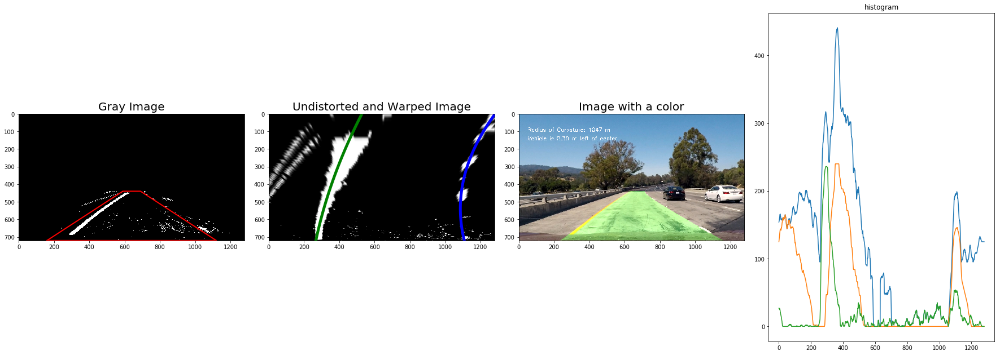

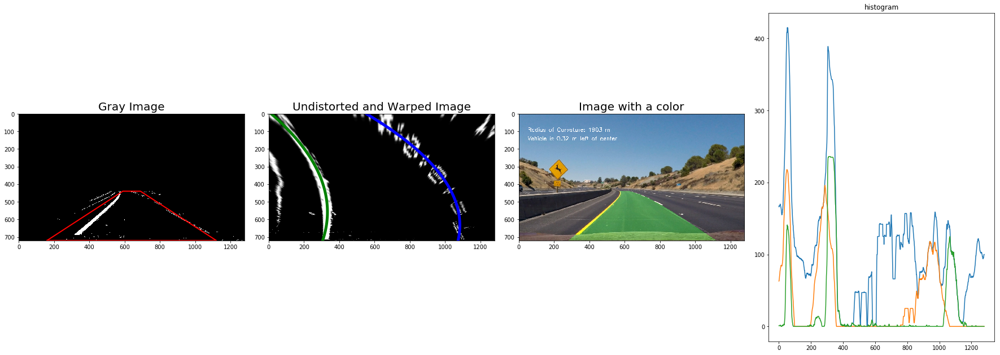

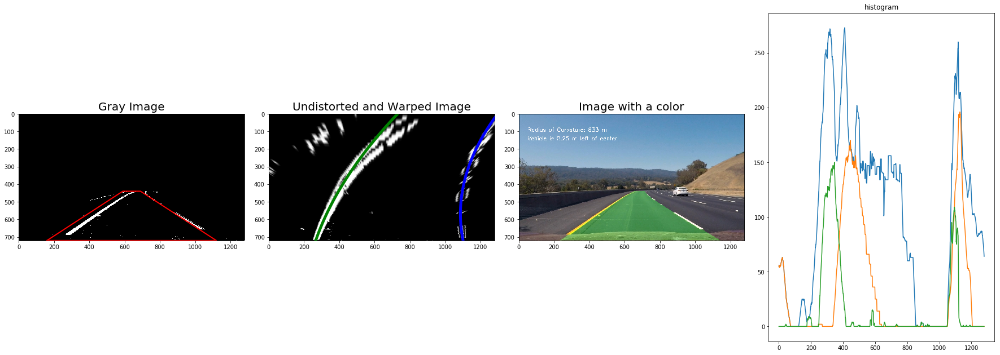

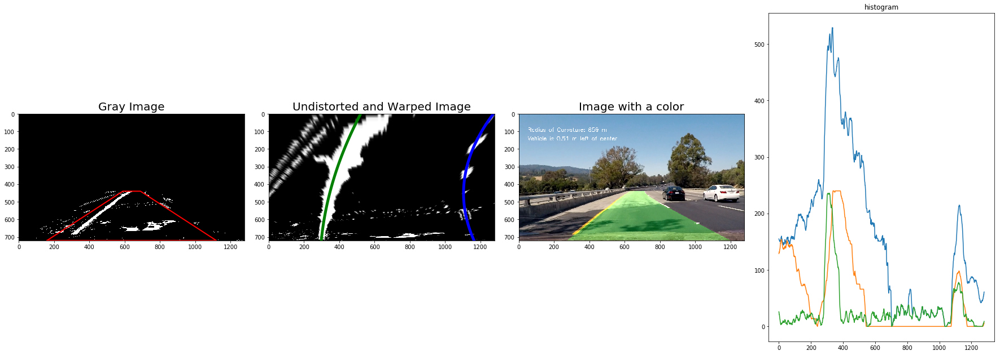

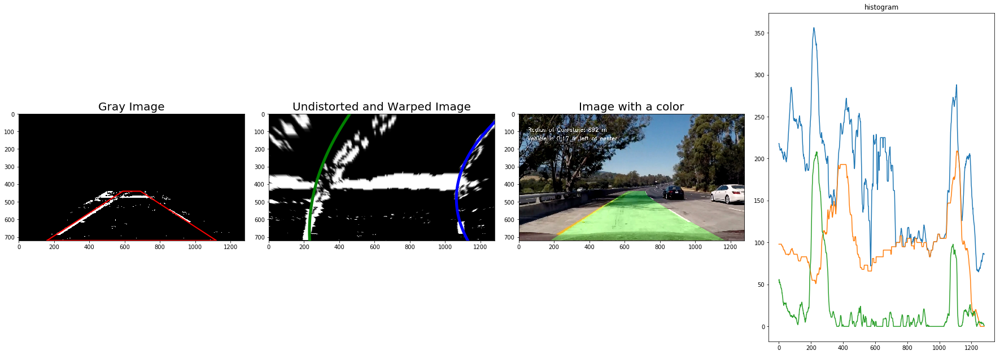

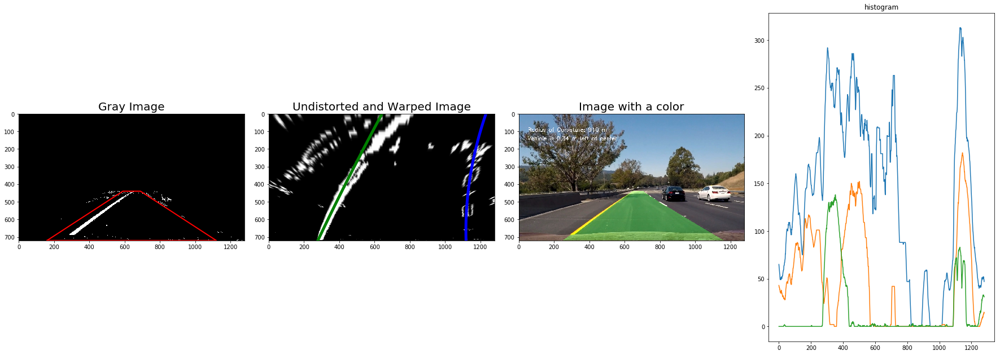

In [31]:
# These are to be used to plot lines on images
x_values = [area_of_interest[0][0],area_of_interest[1][0],area_of_interest[2][0],area_of_interest[3][0],area_of_interest[0][0]]
y_values = [area_of_interest[0][1],area_of_interest[1][1],area_of_interest[2][1],area_of_interest[3][1],area_of_interest[0][1]]

# Plot 6 example images and warp them
for i in range(1,7):
    # Set up lines for left and right
    left_lane = Line()
    right_lane = Line()
    
    # load the image
    fname = 'test_images/test{}.jpg'.format(i)
    img_raw = mpimg.imread(fname)
    # Apply pipeline to the image to create black and white image
    img = pipeline(img_raw)
    # Unwrap the image
    top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)
    # Set up for the subplots
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    
    # Showing the image from pipeline with marked areas
    ax1.set_title('Gray Image', fontsize=20)
    ax1.plot(x_values,y_values,'r-',lw=2)
    ax1.imshow(img, cmap='gray')
    
    # Find lanes from the warped image
    a, b, c, _, _, _, _, _ = fit_lanes(top_down)
    ax2.plot(b, a, color='green', linewidth=5)
    ax2.plot(c, a, color='blue', linewidth=5)
    ax2.imshow(top_down, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=20)
    
     
    # Use the information from fit_lane function to color the lanes
    image_color = process_image(img_raw)
    ax3.imshow(image_color)
    ax3.set_title('Image with a color', fontsize=20)
    
    # Plot three histograms
    top_down[top_down > 0] = 1
    histogram = np.sum(top_down, axis=0)
    ax4.plot(histogram)
    
    histogram = np.sum(top_down[240:480,:], axis=0) # [:240,:]
    ax4.plot(histogram)
    histogram = np.sum(top_down[480:,:], axis=0)
    ax4.plot(histogram)
    
    indexes = find_peaks_cwt(histogram, np.arange(1, 550))
    ax4.set_title("histogram")
    # Adjusting subplots
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Build a Lane Finding Pipeline



In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [47]:
area_of_interest = [[160,720],[590,440],[690,440],[1120,720]]

output = 'project_video_output1.mp4'
left_lane = Line()
right_lane = Line()
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4") # solidWhiteRight challenge solidYellowLeft
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output1.mp4
[MoviePy] Writing video project_video_output1.mp4


100%|█████████▉| 1260/1261 [06:05<00:00,  3.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output1.mp4 

CPU times: user 11min 8s, sys: 5.71 s, total: 11min 14s
Wall time: 6min 6s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [48]:
HTML("""
<video width="720" height="1280" controls>
  <source src="{0}">
</video>
""".format(output))

In [35]:
output = 'harder_challenge_video_output.mp4'
left_lane = Line()
right_lane = Line()
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(30,44) # solidWhiteRight challenge solidYellowLeft
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 350/351 [01:50<00:00,  2.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 3min 14s, sys: 1.76 s, total: 3min 16s
Wall time: 1min 51s


In [36]:
HTML("""
<video width="720" height="1280" controls>
  <source src="{0}">
</video>
""".format(output))

In [49]:
area_of_interest = [[185,540],[410,350],[570,350],[880,540]]

output = 'solidYellowLeft_output.mp4'
left_lane = Line()
right_lane = Line()
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("solidYellowLeft.mp4") # solidWhiteRight challenge solidYellowLeft
# solidWhiteRight  solidYellowLeft
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video solidYellowLeft_output.mp4
[MoviePy] Writing video solidYellowLeft_output.mp4


100%|█████████▉| 681/682 [01:58<00:00,  5.71it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: solidYellowLeft_output.mp4 

CPU times: user 4min 15s, sys: 2.04 s, total: 4min 17s
Wall time: 1min 58s


In [50]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [51]:
area_of_interest = [[185,540],[410,350],[570,350],[880,540]]

output = 'solidWhiteRight_output.mp4'
left_lane = Line()
right_lane = Line()
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("solidWhiteRight.mp4") # solidWhiteRight challenge solidYellowLeft
# solidWhiteRight  solidYellowLeft
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video solidWhiteRight_output.mp4
[MoviePy] Writing video solidWhiteRight_output.mp4


100%|█████████▉| 221/222 [00:37<00:00,  5.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: solidWhiteRight_output.mp4 

CPU times: user 1min 22s, sys: 888 ms, total: 1min 22s
Wall time: 37.8 s


In [52]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))